# Training Yolov8 on FLIR Thermal Image Dataset
Eric is here on deepnet!

## Prepare the environment

### Setup conda

Follow the tutorial [here](https://docs.anaconda.com/free/miniconda/) to set up `miniconda` **locally** (this is very important because if you're not the admin, you can only install packages in your local enviornment), afterwards do `source ~/.bashrc` or restart the terminal to enter the conda base enviornment.

### Create kernel for conda

This is so that your notebook recognizes the conda virtual enviornment. Follow the steps below:

`conda activate base`\
`conda install ipykernel`\
`python -m ipykernel install --user --name=base`

When you open a notebook, you should be able to see `base` as an option to use your kernel in.

### Get pytorch

After you're in the conda virtual enviornment, follow the tutorial [here](https://pytorch.org/get-started/locally/#linux-package-manager) here to get pytorch. Type the command in command line and wait for the package to be installed. You can test it by going to `python` and execute `import torch`, and no errors should occur.

### Setup jupyter notebook

After you have activated the base environment (again, make sure that the conda is the local version by checking whether `which conda` goes into your home folder, and also make sure that you have completed the kernel setup), on the server, install `jupyter lab` or `jupyter notebook`, following the tutorial [here](https://jupyter.org/install). 

After jupyter lab is installed, do `screen -R jupyter_lab_server` to start a screen for server (or other equivalences like `tmux`). In the new screen, make sure that your enviornment is correctly activated, then do 
`jupyter lab --no-browser --port 10000 --ip 0.0.0.0`. Somewhere there you should find a `token`, copy it.

Then on your local machine, start a terminal and execute `ssl -NL 8080:localhost:10000 [your_andrew_id]@deepnet.qatar.cmu.edu`. Go to `localhost:8080` in your browser. After entering your password, you'd be redirected to a page where you can use the token to set a new password.



### Get the FLIR dataset

After filling up the form on the [FLIR webpage](https://www.flir.com/oem/adas/adas-dataset-form/), use wget to download the zipped file to the folder. Then unzip it with `unzip` command.

## Getting yolo ready

You need to first install the `ultralytics` library which contains yolov8 and some other models. In the conda terminal, run `conda install conda-forge::ultralytics`.

In [4]:
import ultralytics  # took around 4-5 hours to get this far
ultralytics.checks()

Ultralytics YOLOv8.2.23 🚀 Python-3.12.2 torch-2.3.0 CUDA:0 (NVIDIA A100 80GB PCIe, 81053MiB)
Setup complete ✅ (96 CPUs, 503.1 GB RAM, 33.8/97.9 GB disk)


### Trying the pretrained model

Running a cool command that checks the GPU status

In [3]:
!nvidia-smi

Tue May 28 08:16:09 2024       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA A100 80G...  On   | 00000000:65:00.0 Off |                    0 |
| N/A   36C    P0    66W / 300W |   5614MiB / 81920MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
|   1  NVIDIA A100 80G...  On   | 00000000:CA:00.0 Off |                    0 |
| N/A   

Then let's do a prediction

In [8]:
from ultralytics import YOLO
from IPython.display import display, Image
HOME = "/data1/jingxia3/SURA"  # this is my project folder


image 1/1 /data1/jingxia3/SURA/example.jpg: 448x640 7 persons, 6.0ms
Speed: 2.3ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict3


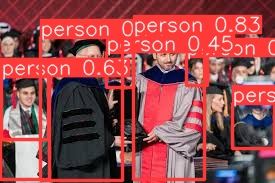

In [13]:
model = YOLO(f'{HOME}/yolov8n.pt')
results = model.predict(source="./example.jpg", conf=0.25, save=True)
Image(filename='./runs/detect/predict/example.jpg', height=800)


image 1/1 /data1/jingxia3/SURA/FLIR/images_thermal_train/data/video-24ysbPEGoEKKDvRt6-frame-000000-4C4FHWxwNaMyohLZt.jpg: 512x640 5 cars, 1 truck, 2 umbrellas, 6.1ms
Speed: 1.8ms preprocess, 6.1ms inference, 1.4ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs/detect/predict5


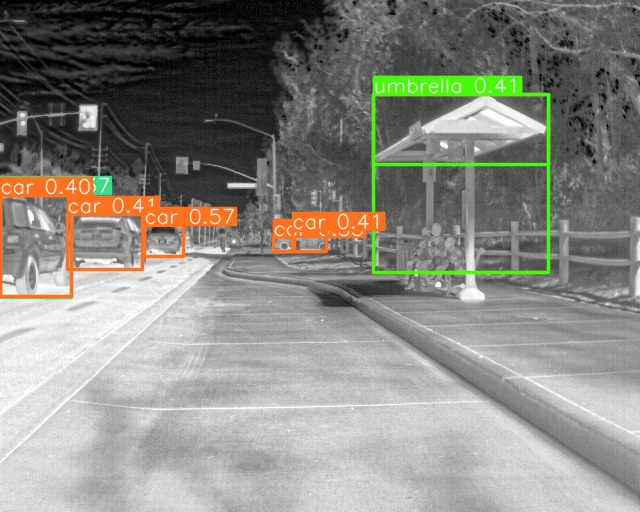

In [45]:
model = YOLO(f'{HOME}/yolov8n.pt')
results = model.predict(source='/data1/jingxia3/SURA/FLIR/images_thermal_train/data/video-24ysbPEGoEKKDvRt6-frame-000000-4C4FHWxwNaMyohLZt.jpg', conf=0.25, save=True)
Image(filename='./runs/detect/predict5/video-24ysbPEGoEKKDvRt6-frame-000000-4C4FHWxwNaMyohLZt.jpg', height=800)


Glad to know that these are all humans.

## Fine-tuning the pretrained model

Yep let's train yolo with FLIR!

### EDA

In [20]:
from glob import glob
import json
import matplotlib.pyplot as plt
import numpy as np
import os
import shutil
from tqdm import tqdm

In [30]:
train_data = glob('./FLIR/video_thermal_test/images/*.jpg')

print(len(train_data))

3749


(512, 640)
(512, 640)
(512, 640)
(512, 640)
(512, 640)
(512, 640)
(512, 640)
(512, 640)
(512, 640)
(512, 640)
(512, 640)
(512, 640)


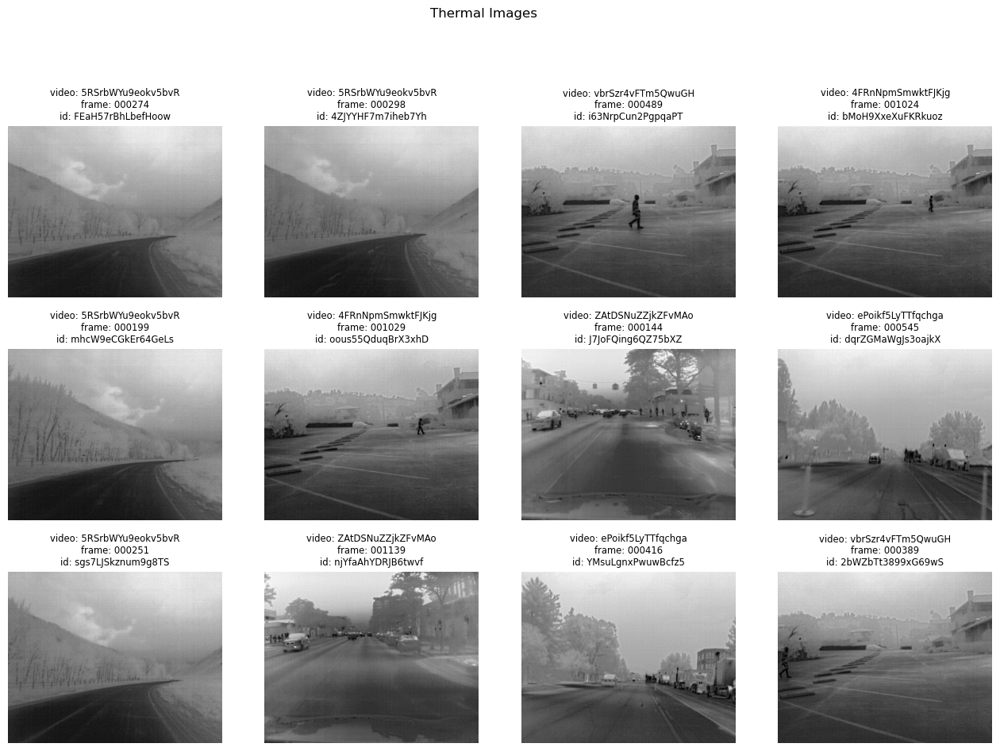

In [43]:
# plot multiple random thermal images
ran_gen = np.random.default_rng()

plt.figure(figsize=(16, 14))
plt.suptitle('Thermal Images')
for i in range(12):
    ax = plt.subplot(4, 4, i+1)
    random_index = ran_gen.integers(low=0, high=3748, size=1)
    i = random_index[0]
    img_loc = train_data[i]
    img_title = 'video: ' + train_data[i][-52:-35]+'\n'+ 'frame: ' + train_data[i][-28:-22]+'\n'+ 'id: ' + train_data[i][-21:-4]
    image = plt.imread(img_loc)
    plt.imshow(image, cmap=plt.cm.binary)
    print(image.shape)
    plt.title(img_title, fontsize='small')
    plt.axis(False)

### Converting labels

In [70]:
def make_folders(output_path):
    if os.path.exists(output_path):
        shutil.rmtree(output_path)
    os.makedirs(output_path)
    return output_path


def convert_bbox_coco2yolo(img_width, img_height, bbox):
    """
    Convert bounding box from COCO  format to YOLO format

    Parameters
    ----------
    img_width : int
        width of image
    img_height : int
        height of image
    bbox : list[int]
        bounding box annotation in COCO format: 
        [top left x position, top left y position, width, height]

    Returns
    -------
    list[float]
        bounding box annotation in YOLO format: 
        [x_center_rel, y_center_rel, width_rel, height_rel]
    """
    
    # YOLO bounding box format: [x_center, y_center, width, height]
    # (float values relative to width and height of image)
    x_tl, y_tl, w, h = bbox

    dw = 1.0 / img_width
    dh = 1.0 / img_height

    x_center = x_tl + w / 2.0
    y_center = y_tl + h / 2.0

    x = x_center * dw
    y = y_center * dh
    w = w * dw
    h = h * dh

    return [x, y, w, h]

def convert_coco_json_to_yolo_txt(output_path, json_file):

    path = make_folders(output_path)

    with open(json_file) as f:
        json_data = json.load(f)

    # write _darknet.labels, which holds names of all classes (one class per line)
    label_file = os.path.join(output_path, "_darknet.labels")
    with open(label_file, "w") as f:
        for category in tqdm(json_data["categories"], desc="Categories"):
            category_name = category["name"]
            f.write(f"{category_name}\n")

    for image in tqdm(json_data["images"], desc="Annotation txt for each iamge"):
        img_id = image["id"]
        img_name = image["file_name"][5:]
        img_width = image["width"]
        img_height = image["height"]

        anno_in_image = [anno for anno in json_data["annotations"] if anno["image_id"] == img_id]
        anno_txt = os.path.join(output_path, img_name.split(".")[0] + ".txt")
        with open(anno_txt, "w") as f:
            for anno in anno_in_image:
                category = anno["category_id"]
                bbox_COCO = anno["bbox"]
                x, y, w, h = convert_bbox_coco2yolo(img_width, img_height, bbox_COCO)
                f.write(f"{category} {x:.6f} {y:.6f} {w:.6f} {h:.6f}\n")

    print("Converting COCO Json to YOLO txt finished!")

In [81]:
# reformat labels for training, validation, and testing datasets
convert_coco_json_to_yolo_txt("./FLIR/images_thermal_train/labels", "./FLIR/images_thermal_train/coco.json")
convert_coco_json_to_yolo_txt("./FLIR/images_thermal_val/labels", "./FLIR/images_thermal_val/coco.json")
convert_coco_json_to_yolo_txt("./FLIR/video_thermal_test/labels", "./FLIR/video_thermal_test/coco.json")

Annotation txt for each iamge: 100%|██████| 10742/10742 [02:49<00:00, 63.39it/s]


Converting COCO Json to YOLO txt finished!


Annotation txt for each iamge: 100%|███████| 1144/1144 [00:01<00:00, 691.22it/s]


Converting COCO Json to YOLO txt finished!


Annotation txt for each iamge: 100%|███████| 3749/3749 [00:14<00:00, 265.46it/s]

Converting COCO Json to YOLO txt finished!


In [82]:
# reformat labels for training, validation, and testing datasets
convert_coco_json_to_yolo_txt("./FLIR/images_rgb_train/labels", "./FLIR/images_rgb_train/coco.json")
convert_coco_json_to_yolo_txt("./FLIR/images_rgb_val/labels", "./FLIR/images_rgb_val/coco.json")
convert_coco_json_to_yolo_txt("./FLIR/video_rgb_test/labels", "./FLIR/video_rgb_test/coco.json")

Annotation txt for each iamge: 100%|██████| 10318/10318 [03:27<00:00, 49.73it/s]


Converting COCO Json to YOLO txt finished!


Annotation txt for each iamge: 100%|██████| 1085/1085 [00:00<00:00, 1176.36it/s]


Converting COCO Json to YOLO txt finished!


Annotation txt for each iamge: 100%|███████| 3749/3749 [00:27<00:00, 138.28it/s]

Converting COCO Json to YOLO txt finished!


### Before training!

In [83]:
import cv2 as cv
from glob import glob
import matplotlib.pyplot as plt
import os
import random
from ultralytics import YOLO

In [86]:
dataset_thermal = './FLIR/data_thermal.yaml'

# load a model
backbone = YOLO("yolov8m.pt")

results_n = backbone.val(data=dataset_thermal, plots=True)

Ultralytics YOLOv8.2.23 🚀 Python-3.12.2 torch-2.3.0 CUDA:0 (NVIDIA A100 80GB PCIe, 81053MiB)
YOLOv8m summary (fused): 218 layers, 25886080 parameters, 0 gradients


val: Scanning /data1/jingxia3/SURA/FLIR/images_thermal_val/labels... 1144 images

val: WARNING ⚠️ /data1/jingxia3/SURA/FLIR/images_thermal_val/images/video-kBvcuDMtYv2Z4kmXi-frame-005290-Rkhr9LNNEftZzJ98w.jpg: 3 duplicate labels removed
val: WARNING ⚠️ /data1/jingxia3/SURA/FLIR/images_thermal_val/images/video-kBvcuDMtYv2Z4kmXi-frame-008818-M29zA3RYL5ud23Cp9.jpg: 5 duplicate labels removed


val: New cache created: /data1/jingxia3/SURA/FLIR/images_thermal_val/labels.cache


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       1144      16688     0.0237     0.0621      0.014    0.00828
               bicycle       1144       4470     0.0703     0.0568     0.0374     0.0175
                   car       1144        170   0.000507      0.218    0.00035   0.000141
            motorcycle       1144       7128      0.106     0.0219     0.0542     0.0306
              airplane       1144         55    0.00112     0.0182   0.000581   0.000523
                 train       1144        179     0.0606      0.374     0.0515     0.0395
                  boat       1144         46    0.00134     0.0217   0.000687   6.87e-05
          fire hydrant       1144       2002    0.00128     0.0015   0.000642     0.0003
             stop sign       1144         94          0          0          0          0
         parking meter       1144       2472     0.0435     0.0328     0.0226     0.0108
             surfboard       1144          3          0          0          0          0
                  boo

In [87]:
dataset_rgb = './FLIR/data_rgb.yaml'

# load a model
backbone = YOLO("yolov8m.pt")

results_n = backbone_nano.val(data=dataset_rgb, plots=True)

Ultralytics YOLOv8.2.23 🚀 Python-3.12.2 torch-2.3.0 CUDA:0 (NVIDIA A100 80GB PCIe, 81053MiB)


val: Scanning /data1/jingxia3/SURA/FLIR/images_rgb_val/labels... 1085 images, 16

val: New cache created: /data1/jingxia3/SURA/FLIR/images_rgb_val/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       1085      16909     0.0335      0.067     0.0195     0.0107
               bicycle       1085       3223      0.141      0.166     0.0877     0.0406
                   car       1085        193   0.000697      0.321   0.000482   0.000215
            motorcycle       1085       7285      0.173     0.0626     0.0918       0.05
              airplane       1085         77          0          0          0          0
                 train       1085        183     0.0356      0.213     0.0257       0.02
                  boat       1085         47    0.00149     0.0213   0.000775   0.000698
          fire hydrant       1085       2143   0.000703   0.000467   0.000358   7.17e-05
             stop sign       1085        126          0          0          0          0
         parking meter       1085       3581     0.0502     0.0198      0.027     0.0163
             surfboard       1085          4          0          0          0          0
                  boo

## Pretrained YOLOv8 on RGB => evaluating thermal

Generate labels on RGB images with pretrained yolo, transfer labels to corresponding thermal images, and evaluate pretrained yolo performance on thermal images

In [207]:
import os
import shutil
from ultralytics import YOLO

# Define paths
thermal_image_dir = '/data1/jingxia3/SURA/FLIR/video_thermal_test/images/'
rgb_image_dir = '/data1/jingxia3/SURA/FLIR/video_rgb_test/images/'

# Load the pretrained YOLOv8 model
model = YOLO('yolov8n.pt')  # or any other yolov8 model

In [302]:
# Function to perform inference on RGB images and save annotations
def generate_annotations(model, image_dir, save_dir):
    os.makedirs(save_dir, exist_ok=True)
    image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]
    print(f"Generating annotations for {len(image_files)} images")
    for image_file in image_files:
        image_path = os.path.join(image_dir, image_file)
        results = model(image_path, verbose=False, imgsz=640)
        annotation_path = os.path.join(save_dir, image_file.replace('.jpg', '.txt'))
        # Save the predicted text file to disk
        with open(annotation_path, 'w') as file:
            for i, prediction in enumerate(results[0].boxes.xywhn):
                line = f"{int(results[0].boxes.cls[i])} {prediction[0].item()} {prediction[1].item()} {prediction[2].item()} {prediction[3].item()}\n"
                file.write(line)
            # if len(results[0].boxes.xyxyn) > 0:
            #     print(image_path)
    print("Done!")

# Paths to save RGB annotations
rgb_annotation_dir = '/data1/jingxia3/SURA/FLIR/labels/'

# Generate annotations for RGB images
generate_annotations(model, rgb_image_dir, rgb_annotation_dir)

Generating annotations for 3749 images
Done!


/data1/jingxia3/SURA/FLIR/video_rgb_test/images/video-msNEBxJE5PPDqenBM-frame-006429-dJHJG6pb2ME8EtWT4.jpg
/data1/jingxia3/SURA/FLIR/video_rgb_test/images/video-PGdt7pJChnKoJDt35-frame-000510-SnzohhSZxMifNuHfS.jpg
/data1/jingxia3/SURA/FLIR/video_rgb_test/images/video-RMxN6a4CcCeLGu4tA-frame-001223-zPqxDBnRCygHiXTap.jpg
/data1/jingxia3/SURA/FLIR/video_rgb_test/images/video-dvZBYnphN2BwdMKBc-frame-000143-avrBref6CSqJ6EReW.jpg
/data1/jingxia3/SURA/FLIR/video_rgb_test/images/video-msNEBxJE5PPDqenBM-frame-006431-4roQEXcZPvsXRkhgA.jpg
/data1/jingxia3/SURA/FLIR/video_rgb_test/images/video-RMxN6a4CcCeLGu4tA-frame-001451-ffk3ZfKBvy4AjBNJ6.jpg
/data1/jingxia3/SURA/FLIR/video_rgb_test/images/video-YnfPeH8i2uBWmsSd2-frame-000467-zuJYfzqcShGSmCQBz.jpg
/data1/jingxia3/SURA/FLIR/video_rgb_test/images/video-FkqCGijjAKpABetZZ-frame-000069-kgscu74RZpZvWc3Mk.jpg


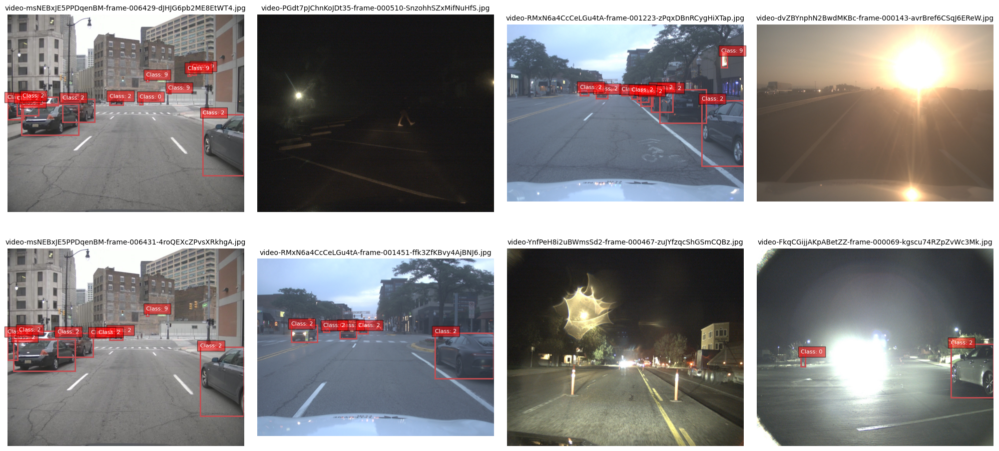

In [304]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

random.seed(0)
image_files = [f for f in os.listdir(rgb_image_dir) if f.endswith('.jpg')]
selected_images = random.sample(image_files, 8)

def load_annotations(annotation_file):
    annotations = []
    with open(annotation_file, 'r') as file:
        for line in file:
            parts = line.strip().split()
            cls = int(parts[0])
            bbox = [float(p) for p in parts[1:]]
            annotations.append((cls, bbox))
    return annotations

def visualize_annotations(ax, image_path, annotations, title):
    image = Image.open(image_path)
    ax.imshow(image)
    ax.set_title(title, fontsize=10)
    for cls, bbox in annotations:
        center_x, center_y, width_n, height_n = bbox
        x_min = center_x*image.width - 0.5*width_n*image.width
        y_min = center_y*image.height - 0.5*height_n*image.height
        width = width_n*image.width
        height = height_n*image.height
        rect = patches.Rectangle((x_min, y_min), width, height, linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        ax.text(x_min, y_min, f'Class: {cls}', color='white', fontsize=8, bbox=dict(facecolor='red', alpha=0.5))
    ax.axis('off')

def verify_annotations(image_dir, annotation_dir):
    fig, axs = plt.subplots(2, 4, figsize=(20, 10))
    axs = axs.flatten()

    for i, image_file in enumerate(selected_images):
        image_path = os.path.join(image_dir, image_file)
        annotation_file = os.path.join(annotation_dir, image_file.replace('.jpg', '.txt'))
        annotations = load_annotations(annotation_file)
        print(image_path)
        visualize_annotations(axs[i], image_path, annotations, image_file)
    
    plt.tight_layout()
    plt.show()
    
# Verify and visualize annotations for 8 random images
verify_annotations(rgb_image_dir, rgb_annotation_dir)

In [305]:
!rm -rf /data1/jingxia3/SURA/FLIR/dataset/train
!rm -rf /data1/jingxia3/SURA/FLIR/dataset/test
!rm -rf /data1/jingxia3/SURA/FLIR/dataset/val

!mkdir /data1/jingxia3/SURA/FLIR/dataset/train

!cp -rf /data1/jingxia3/SURA/FLIR/video_thermal_test/images /data1/jingxia3/SURA/FLIR/dataset/train/
!cp -rf /data1/jingxia3/SURA/FLIR/labels /data1/jingxia3/SURA/FLIR/dataset/train/

!cp -rf /data1/jingxia3/SURA/FLIR/dataset/train /data1/jingxia3/SURA/FLIR/dataset/test
!cp -rf /data1/jingxia3/SURA/FLIR/dataset/train /data1/jingxia3/SURA/FLIR/dataset/val

In [306]:
import os
import json

def rename_images(filedir):
    # Load the JSON mapping file
    with open('/data1/jingxia3/SURA/FLIR/rgb_to_thermal_vid_map.json') as f:
        mapping = json.load(f)
        rgb2thermal_mapping = {v: k for k, v in mapping.items()}
        
    image_files = [f for f in os.listdir(filedir+"/images") if f.endswith('.jpg')] # currently label names correspond to rgb ones

    failed = 0
    
    for name in image_files:
        try:
            thermal_name = rgb2thermal_mapping[name]
            os.rename(filedir+"/images/"+name, filedir+"/images/"+thermal_name)
        except KeyError:
            failed += 1
            
    
    print(f"Done with {filedir}, failed to rename {failed} files")


dataset_train_dir = '/data1/jingxia3/SURA/FLIR/dataset/train'
dataset_test_dir = '/data1/jingxia3/SURA/FLIR/dataset/test'
dataset_val_dir = '/data1/jingxia3/SURA/FLIR/dataset/val'

rename_images(dataset_train_dir)
rename_images(dataset_test_dir)
rename_images(dataset_val_dir)

Done with /data1/jingxia3/SURA/FLIR/dataset/train, failed to rename 0 files
Done with /data1/jingxia3/SURA/FLIR/dataset/test, failed to rename 0 files
Done with /data1/jingxia3/SURA/FLIR/dataset/val, failed to rename 0 files


/data1/jingxia3/SURA/FLIR/dataset/train/images/video-msNEBxJE5PPDqenBM-frame-006429-dJHJG6pb2ME8EtWT4.jpg
/data1/jingxia3/SURA/FLIR/dataset/train/images/video-PGdt7pJChnKoJDt35-frame-000510-SnzohhSZxMifNuHfS.jpg
/data1/jingxia3/SURA/FLIR/dataset/train/images/video-RMxN6a4CcCeLGu4tA-frame-001223-zPqxDBnRCygHiXTap.jpg
/data1/jingxia3/SURA/FLIR/dataset/train/images/video-dvZBYnphN2BwdMKBc-frame-000143-avrBref6CSqJ6EReW.jpg
/data1/jingxia3/SURA/FLIR/dataset/train/images/video-msNEBxJE5PPDqenBM-frame-006431-4roQEXcZPvsXRkhgA.jpg
/data1/jingxia3/SURA/FLIR/dataset/train/images/video-RMxN6a4CcCeLGu4tA-frame-001451-ffk3ZfKBvy4AjBNJ6.jpg
/data1/jingxia3/SURA/FLIR/dataset/train/images/video-YnfPeH8i2uBWmsSd2-frame-000467-zuJYfzqcShGSmCQBz.jpg
/data1/jingxia3/SURA/FLIR/dataset/train/images/video-FkqCGijjAKpABetZZ-frame-000069-kgscu74RZpZvWc3Mk.jpg


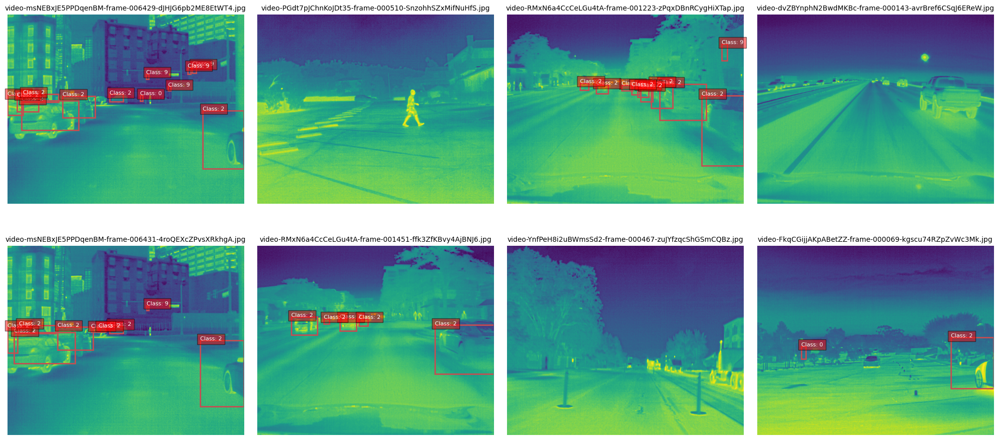

In [307]:
verify_annotations(dataset_train_dir+"/images", dataset_train_dir+"/labels")

In [308]:
# Evaluate the model
metrics = model.val(data="/data1/jingxia3/SURA/FLIR/dataset/data.yaml", imgsz=640, plots=True, batch=8)

Ultralytics YOLOv8.2.23 🚀 Python-3.12.2 torch-2.3.0 CUDA:0 (NVIDIA A100 80GB PCIe, 81053MiB)


val: Scanning /data1/jingxia3/SURA/FLIR/dataset/val/labels... 3749 images, 1660 

val: New cache created: /data1/jingxia3/SURA/FLIR/dataset/val/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3749      18213      0.406     0.0116    0.00853    0.00202
                person       3749       2540      0.045     0.0744     0.0113    0.00222
               bicycle       3749         35          0          0          0          0
                   car       3749      11343      0.251      0.131     0.0917     0.0225
            motorcycle       3749       1232          0          0     0.0393     0.0085
                   bus       3749          6          0          0   0.000748   0.000304
                 train       3749         14          0          0   0.000191   0.000101
                 truck       3749        323    0.00428     0.0031    0.00251   0.000674
         traffic light       3749       2604          0          0    0.00735      0.002
          fire hydrant       3749         58          0          0          0          0
             stop sign       3749          2          1          0          0          0
         parking mete

In [309]:
!rm -rf /data1/jingxia3/SURA/FLIR/isitright/train
!rm -rf /data1/jingxia3/SURA/FLIR/isitright/test
!rm -rf /data1/jingxia3/SURA/FLIR/isitright/val

!mkdir /data1/jingxia3/SURA/FLIR/isitright/train

!cp -rf /data1/jingxia3/SURA/FLIR/video_rgb_test/images /data1/jingxia3/SURA/FLIR/isitright/train/
!cp -rf /data1/jingxia3/SURA/FLIR/labels /data1/jingxia3/SURA/FLIR/isitright/train/

!cp -rf /data1/jingxia3/SURA/FLIR/isitright/train /data1/jingxia3/SURA/FLIR/isitright/test
!cp -rf /data1/jingxia3/SURA/FLIR/isitright/train /data1/jingxia3/SURA/FLIR/isitright/val

/data1/jingxia3/SURA/FLIR/isitright/train/images/video-msNEBxJE5PPDqenBM-frame-006429-dJHJG6pb2ME8EtWT4.jpg
/data1/jingxia3/SURA/FLIR/isitright/train/images/video-PGdt7pJChnKoJDt35-frame-000510-SnzohhSZxMifNuHfS.jpg
/data1/jingxia3/SURA/FLIR/isitright/train/images/video-RMxN6a4CcCeLGu4tA-frame-001223-zPqxDBnRCygHiXTap.jpg
/data1/jingxia3/SURA/FLIR/isitright/train/images/video-dvZBYnphN2BwdMKBc-frame-000143-avrBref6CSqJ6EReW.jpg
/data1/jingxia3/SURA/FLIR/isitright/train/images/video-msNEBxJE5PPDqenBM-frame-006431-4roQEXcZPvsXRkhgA.jpg
/data1/jingxia3/SURA/FLIR/isitright/train/images/video-RMxN6a4CcCeLGu4tA-frame-001451-ffk3ZfKBvy4AjBNJ6.jpg
/data1/jingxia3/SURA/FLIR/isitright/train/images/video-YnfPeH8i2uBWmsSd2-frame-000467-zuJYfzqcShGSmCQBz.jpg
/data1/jingxia3/SURA/FLIR/isitright/train/images/video-FkqCGijjAKpABetZZ-frame-000069-kgscu74RZpZvWc3Mk.jpg


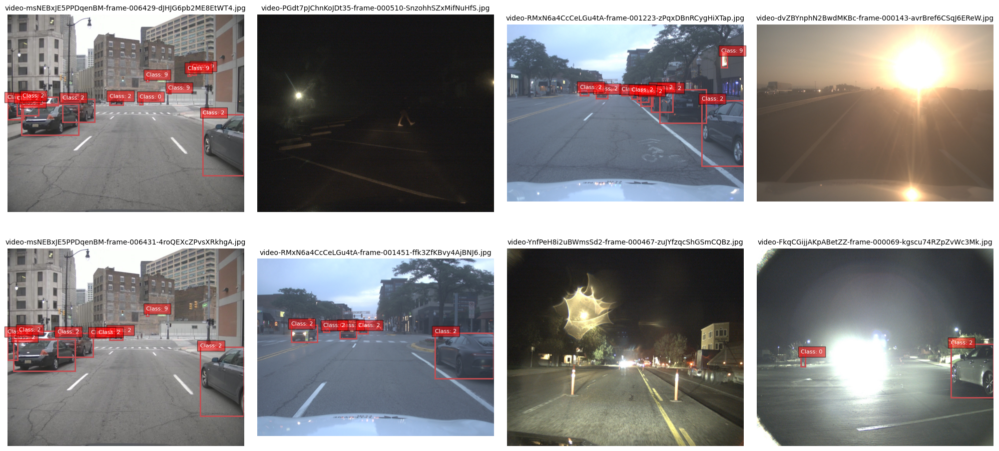

In [310]:
isitright_dir = "/data1/jingxia3/SURA/FLIR/isitright/train"
verify_annotations(isitright_dir+"/images", isitright_dir+"/labels")

In [4]:
# is it right?|
model = YOLO("yolov8n.pt")
isitright = model.val(data="/data1/jingxia3/SURA/FLIR/isitright/data.yaml", imgsz=640, plots=True, batch=8)

Ultralytics YOLOv8.2.23 🚀 Python-3.12.2 torch-2.3.0 CUDA:0 (NVIDIA A100 80GB PCIe, 81053MiB)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients


val: Scanning /data1/jingxia3/SURA/FLIR/isitright/val/labels.cache... 3749 image
                 Class     Images  Instances      Box(P          R      mAP50  m/data1/jingxia3/miniconda3/lib/python3.12/site-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at /opt/conda/conda-bld/pytorch_1712608847532/work/aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3749      18213       0.77      0.545      0.658      0.598
                person       3749       2540      0.946      0.854      0.958      0.876
               bicycle       3749         35      0.684      0.743       0.83      0.705
                   car       3749      11343      0.908       0.87      0.953      0.863
            motorcycle       3749       1232      0.892      0.787      0.923      0.797
                   bus       3749          6      0.277      0.263      0.272      0.268
                 train       3749         14      0.753      0.429      0.633      0.627
                 truck       3749        323       0.64      0.789      0.786      0.742
         traffic light       3749       2604      0.902      0.844      0.948      0.865
          fire hydrant       3749         58      0.774      0.897      0.936      0.877
             stop sign       3749          2      0.463          1      0.995      0.846
         parking mete

In [315]:
# "video-RMxN6a4CcCeLGu4tA-frame-001157-fSDCr9PcNdqxocmdq.jpg": "video-ZAtDSNuZZjkZFvMAo-frame-001157-9d7Pk3pE4NKTQasvA.jpg", 

rgbsample = model.predict(source='/data1/jingxia3/SURA/FLIR/video_rgb_test/images/video-RMxN6a4CcCeLGu4tA-frame-001157-fSDCr9PcNdqxocmdq.jpg', save=True)
thermalsample = model.predict(source='/data1/jingxia3/SURA/FLIR/video_thermal_test/images/video-ZAtDSNuZZjkZFvMAo-frame-001157-9d7Pk3pE4NKTQasvA.jpg', save=True)

Results saved to runs/detect/predict6
Results saved to runs/detect/predict6


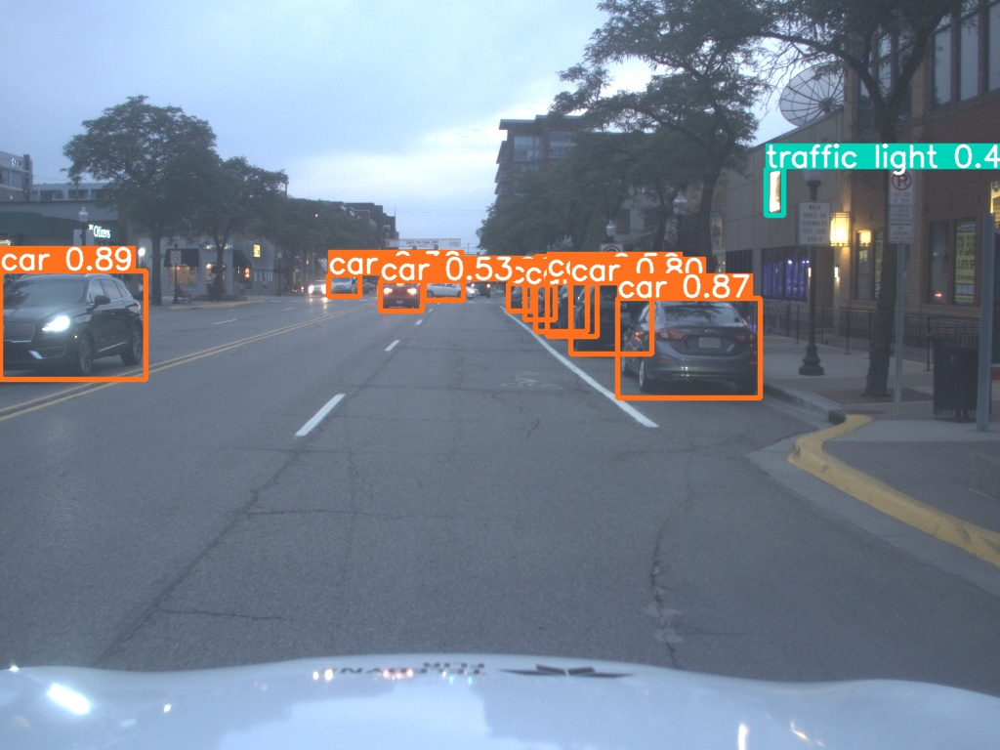

In [318]:
from IPython.display import display, Image

Image(filename='./runs/detect/predict6/video-RMxN6a4CcCeLGu4tA-frame-001157-fSDCr9PcNdqxocmdq.jpg', height=800)

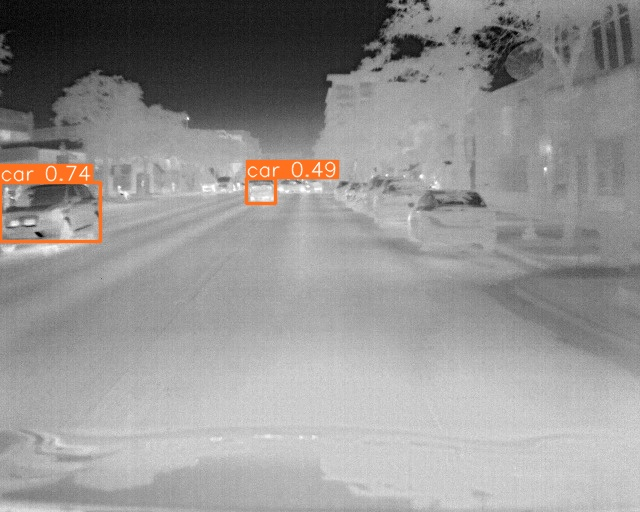

In [319]:
Image(filename='./runs/detect/predict6/video-ZAtDSNuZZjkZFvMAo-frame-001157-9d7Pk3pE4NKTQasvA.jpg', height=800)

In [2]:
# is it right?|
from ultralytics import YOLO
model = YOLO('yolov8s.pt')  # or any other yolov8 model
isitright = model.val(data="/data1/jingxia3/SURA/FLIR/isitright/data.yaml", imgsz=640, plots=True, batch=8)

Ultralytics YOLOv8.2.23 🚀 Python-3.12.2 torch-2.3.0 CUDA:0 (NVIDIA A100 80GB PCIe, 81053MiB)
YOLOv8s summary (fused): 168 layers, 11156544 parameters, 0 gradients


val: Scanning /data1/jingxia3/SURA/FLIR/isitright/val/labels.cache... 3749 image
                 Class     Images  Instances      Box(P          R      mAP50  m/data1/jingxia3/miniconda3/lib/python3.12/site-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at /opt/conda/conda-bld/pytorch_1712608847532/work/aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3749      18213      0.442      0.453      0.431      0.336
                person       3749       2540      0.665      0.872      0.867      0.663
               bicycle       3749         35      0.468      0.657      0.558      0.369
                   car       3749      11343      0.731      0.834       0.87      0.688
            motorcycle       3749       1232      0.624      0.804      0.788      0.584
                   bus       3749          6     0.0214      0.167     0.0141     0.0116
                 train       3749         14      0.684      0.357       0.36      0.311
                 truck       3749        323      0.431      0.712      0.634      0.539
         traffic light       3749       2604      0.593      0.759      0.757      0.536
          fire hydrant       3749         58      0.587      0.914      0.844      0.672
             stop sign       3749          2          0          0     0.0173     0.0156
         parking mete

In [3]:
# is it right?|
model = YOLO('yolov8m.pt')  # or any other yolov8 model
isitright = model.val(data="/data1/jingxia3/SURA/FLIR/isitright/data.yaml", imgsz=640, plots=True, batch=8)

Ultralytics YOLOv8.2.23 🚀 Python-3.12.2 torch-2.3.0 CUDA:0 (NVIDIA A100 80GB PCIe, 81053MiB)
YOLOv8m summary (fused): 218 layers, 25886080 parameters, 0 gradients


val: Scanning /data1/jingxia3/SURA/FLIR/isitright/val/labels.cache... 3749 image
                 Class     Images  Instances      Box(P          R      mAP50  m/data1/jingxia3/miniconda3/lib/python3.12/site-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at /opt/conda/conda-bld/pytorch_1712608847532/work/aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3749      18213      0.594      0.441      0.393      0.299
                person       3749       2540      0.604      0.842      0.805      0.573
               bicycle       3749         35      0.282      0.629      0.512      0.355
                   car       3749      11343      0.756      0.788      0.831      0.632
            motorcycle       3749       1232      0.674      0.752      0.761      0.521
                   bus       3749          6          0          0    0.00269    0.00248
                 train       3749         14          1          0    0.00617    0.00343
                 truck       3749        323      0.327      0.824      0.497      0.418
         traffic light       3749       2604      0.612      0.664       0.66      0.442
          fire hydrant       3749         58      0.631      0.793      0.766      0.611
             stop sign       3749          2          1          0    0.00592    0.00532
         parking mete

## Fixing alignment

Trying SIFT

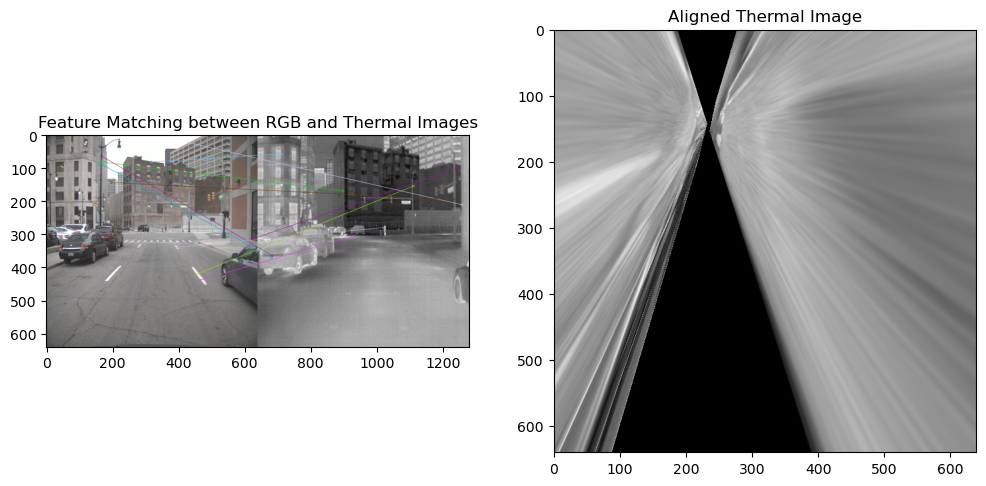

In [339]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def match_and_transform_images(rgb_image_path, thermal_image_path, output_size=(640, 640)):
    # Load the RGB and thermal images
    rgb_image = cv2.imread(rgb_image_path)
    thermal_image = cv2.imread(thermal_image_path, cv2.IMREAD_GRAYSCALE)

    # Check if images loaded correctly
    if rgb_image is None or thermal_image is None:
        raise ValueError("Error loading images")

    # Resize images to the desired output size
    rgb_image = cv2.resize(rgb_image, output_size)
    thermal_image = cv2.resize(thermal_image, output_size)

    # Convert the RGB image to grayscale
    rgb_image_gray = cv2.cvtColor(rgb_image, cv2.COLOR_BGR2GRAY)

    # Initialize the SIFT detector
    sift = cv2.SIFT_create()

    # Find keypoints and descriptors with SIFT in both images
    keypoints_rgb, descriptors_rgb = sift.detectAndCompute(rgb_image_gray, None)
    keypoints_thermal, descriptors_thermal = sift.detectAndCompute(thermal_image, None)

    # Create BFMatcher object
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

    # Match descriptors
    matches = bf.match(descriptors_rgb, descriptors_thermal)

    # Sort matches by distance
    matches = sorted(matches, key=lambda x: x.distance)

    # Extract location of good matches
    points_rgb = np.zeros((len(matches), 2), dtype=np.float32)
    points_thermal = np.zeros((len(matches), 2), dtype=np.float32)

    for i, match in enumerate(matches):
        points_rgb[i, :] = keypoints_rgb[match.queryIdx].pt
        points_thermal[i, :] = keypoints_thermal[match.trainIdx].pt

    # Find homography
    homography, mask = cv2.findHomography(points_thermal, points_rgb, cv2.RANSAC, 5.0)

    # Use the homography to transform the thermal image
    height, width = rgb_image.shape[:2]
    aligned_thermal_image = cv2.warpPerspective(thermal_image, homography, (width, height))

    # Draw the matches for visualization
    matched_image = cv2.drawMatches(rgb_image, keypoints_rgb, thermal_image, keypoints_thermal, matches[:10], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    # Display the matching result
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(matched_image, cv2.COLOR_BGR2RGB))
    plt.title('Feature Matching between RGB and Thermal Images')
    plt.subplot(1, 2, 2)
    plt.imshow(aligned_thermal_image, cmap='gray')
    plt.title('Aligned Thermal Image')
    plt.show()

    return aligned_thermal_image, matches, keypoints_rgb, keypoints_thermal

# Usage example:
rgb_image_path = '/data1/jingxia3/SURA/FLIR/example_rgb.jpg'
thermal_image_path = '/data1/jingxia3/SURA/FLIR/example_thermal.jpg'
aligned_thermal_image, matches, keypoints_rgb, keypoints_thermal = match_and_transform_images(rgb_image_path, thermal_image_path)

Trying ECC

In [340]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def align_images_ecc(rgb_image_path, thermal_image_path, output_size=(640, 640)):
    # Load the RGB and thermal images
    rgb_image = cv2.imread(rgb_image_path)
    thermal_image = cv2.imread(thermal_image_path, cv2.IMREAD_GRAYSCALE)

    # Check if images loaded correctly
    if rgb_image is None or thermal_image is None:
        raise ValueError("Error loading images")

    # Resize images to the desired output size
    rgb_image = cv2.resize(rgb_image, output_size)
    thermal_image = cv2.resize(thermal_image, output_size)

    # Convert the RGB image to grayscale
    rgb_image_gray = cv2.cvtColor(rgb_image, cv2.COLOR_BGR2GRAY)

    # Define the motion model
    warp_mode = cv2.MOTION_HOMOGRAPHY

    # Initialize the warp matrix to identity
    warp_matrix = np.eye(3, 3, dtype=np.float32)

    # Define the number of iterations and termination criteria
    number_of_iterations = 5000
    termination_eps = 1e-10
    criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, number_of_iterations, termination_eps)

    # Run the ECC algorithm to find the warp matrix
    (cc, warp_matrix) = cv2.findTransformECC(rgb_image_gray, thermal_image, warp_matrix, warp_mode, criteria)

    # Use the warp matrix to transform the thermal image
    height, width = rgb_image.shape[:2]
    aligned_thermal_image = cv2.warpPerspective(thermal_image, warp_matrix, (width, height), flags=cv2.INTER_LINEAR + cv2.WARP_INVERSE_MAP)

    # Display the aligned thermal image
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(rgb_image, cv2.COLOR_BGR2RGB))
    plt.title('RGB Image')
    plt.subplot(1, 2, 2)
    plt.imshow(aligned_thermal_image, cmap='gray')
    plt.title('Aligned Thermal Image')
    plt.show()

    return aligned_thermal_image

# Usage example:
rgb_image_path = '/data1/jingxia3/SURA/FLIR/example_rgb.jpg'
thermal_image_path = '/data1/jingxia3/SURA/FLIR/example_thermal.jpg'
aligned_thermal_image = align_images_ecc(rgb_image_path, thermal_image_path)

error: OpenCV(4.9.0) /home/conda/feedstock_root/build_artifacts/libopencv_1716151572399/work/modules/video/src/ecc.cpp:589: error: (-7:Iterations do not converge) The algorithm stopped before its convergence. The correlation is going to be minimized. Images may be uncorrelated or non-overlapped in function 'findTransformECC'


Trying FFT

/tmp/ipykernel_175307/331531277.py:28: RuntimeWarning: invalid value encountered in divide
  cross_power_spectrum /= np.abs(cross_power_spectrum)


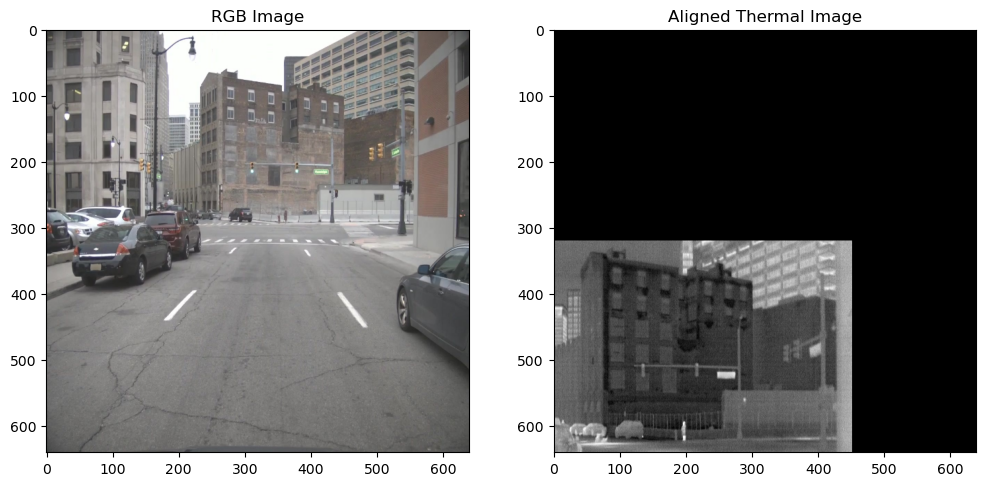

In [341]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def align_images_phase_correlation(rgb_image_path, thermal_image_path, output_size=(640, 640)):
    # Load the RGB and thermal images
    rgb_image = cv2.imread(rgb_image_path)
    thermal_image = cv2.imread(thermal_image_path, cv2.IMREAD_GRAYSCALE)

    # Check if images loaded correctly
    if rgb_image is None or thermal_image is None:
        raise ValueError("Error loading images")

    # Resize images to the desired output size
    rgb_image = cv2.resize(rgb_image, output_size)
    thermal_image = cv2.resize(thermal_image, output_size)

    # Convert the RGB image to grayscale
    rgb_image_gray = cv2.cvtColor(rgb_image, cv2.COLOR_BGR2GRAY)

    # Compute the 2D FFT of the images
    dft_rgb = cv2.dft(np.float32(rgb_image_gray), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_thermal = cv2.dft(np.float32(thermal_image), flags=cv2.DFT_COMPLEX_OUTPUT)

    # Compute the cross-power spectrum
    dft_rgb_conj = np.conj(dft_rgb)
    cross_power_spectrum = dft_rgb_conj * dft_thermal
    cross_power_spectrum /= np.abs(cross_power_spectrum)

    # Compute the inverse DFT to get the phase correlation result
    phase_corr = cv2.idft(cross_power_spectrum, flags=cv2.DFT_SCALE | cv2.DFT_REAL_OUTPUT)

    # Find the peak in the phase correlation result
    (max_val, _, max_loc, _) = cv2.minMaxLoc(phase_corr)
    shift = (max_loc[0] - output_size[0]//2, max_loc[1] - output_size[1]//2)

    # Apply the translation to the thermal image
    translation_matrix = np.float32([[1, 0, -shift[0]], [0, 1, -shift[1]]])
    aligned_thermal_image = cv2.warpAffine(thermal_image, translation_matrix, output_size)

    # Display the aligned thermal image
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(rgb_image, cv2.COLOR_BGR2RGB))
    plt.title('RGB Image')
    plt.subplot(1, 2, 2)
    plt.imshow(aligned_thermal_image, cmap='gray')
    plt.title('Aligned Thermal Image')
    plt.show()

    return aligned_thermal_image

# Usage example:
rgb_image_path = '/data1/jingxia3/SURA/FLIR/example_rgb.jpg'
thermal_image_path = '/data1/jingxia3/SURA/FLIR/example_thermal.jpg'
aligned_thermal_image = align_images_phase_correlation(rgb_image_path, thermal_image_path)

### How does model perform with single-class labels?

Rename labels (change all labels to 0), change yaml files to 1 class

In [321]:
!cp -r /data1/jingxia3/SURA/FLIR/labels /data1/jingxia3/SURA/FLIR/labels_binary

In [323]:
new_label_dir = '/data1/jingxia3/SURA/FLIR/labels_binary/'

new_label_files = [f for f in os.listdir(new_label_dir) if f.endswith('.txt')] # currently label names correspond to rgb ones

for new_label_file in new_label_files:
    file_path = new_label_dir + new_label_file
    with open(file_path, 'r') as file:
        lines = file.readlines()
    
    modified_lines = []
    for line in lines:
        columns = line.split()
        columns[0] = '0'  # Change the first column to 0
        modified_line = ' '.join(columns)
        modified_lines.append(modified_line)
    
    with open(file_path, 'w') as file:
        for modified_line in modified_lines:
            file.write(modified_line + '\n')

print(f"Done with {len(new_label_files)} files!")

Done with 3749 files!


In [324]:
!cp -rf /data1/jingxia3/SURA/FLIR/dataset /data1/jingxia3/SURA/FLIR/dataset_binary

!cp -rf /data1/jingxia3/SURA/FLIR/labels_binary /data1/jingxia3/SURA/FLIR/dataset_binary/train/labels
!cp -rf /data1/jingxia3/SURA/FLIR/labels_binary /data1/jingxia3/SURA/FLIR/dataset_binary/test/labels
!cp -rf /data1/jingxia3/SURA/FLIR/labels_binary /data1/jingxia3/SURA/FLIR/dataset_binary/val/labels

Then I modified the `data.yaml`

In [343]:
# metrics = model.val(data="/data1/jingxia3/SURA/FLIR/dataset_binary/data.yaml", imgsz=640, plots=True, batch=8)

In [345]:
!cp -rf /data1/jingxia3/SURA/FLIR/dataset_binary /data1/jingxia3/SURA/FLIR/isitright_binary

!cp -rf /data1/jingxia3/SURA/FLIR/isitright/train/images /data1/jingxia3/SURA/FLIR/isitright_binary/train/images
!cp -rf /data1/jingxia3/SURA/FLIR/isitright/test/images /data1/jingxia3/SURA/FLIR/isitright_binary/test/images
!cp -rf /data1/jingxia3/SURA/FLIR/isitright/val/images /data1/jingxia3/SURA/FLIR/isitright_binary/val/images

Then I modified `data.yaml`

In [347]:
# metrics = model.val(data="/data1/jingxia3/SURA/FLIR/isitright_binary/data.yaml", imgsz=640, plots=True, batch=8)

### How about just using old labels?

In [348]:
# Function to perform inference on RGB images and save annotations
def generate_annotations(model, image_dir, save_dir):
    os.makedirs(save_dir, exist_ok=True)
    image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]
    print(f"Generating annotations for {len(image_files)} images")
    for image_file in image_files:
        image_path = os.path.join(image_dir, image_file)
        results = model(image_path, verbose=False, imgsz=640)
        annotation_path = os.path.join(save_dir, image_file.replace('.jpg', '.txt'))
        # Save the predicted text file to disk
        with open(annotation_path, 'w') as file:
            for i, prediction in enumerate(results[0].boxes.xywhn):
                line = f"{int(results[0].boxes.cls[i])} {prediction[0].item()} {prediction[1].item()} {prediction[2].item()} {prediction[3].item()}\n"
                file.write(line)
            # if len(results[0].boxes.xyxyn) > 0:
            #     print(image_path)
    print("Done!")

thermal_image_dir = '/data1/jingxia3/SURA/FLIR/dataset/train/images/'
thermal_annotation_dir = '/data1/jingxia3/SURA/FLIR/thermal_labels/'

# Generate annotations for RGB images
generate_annotations(model, thermal_image_dir, thermal_annotation_dir)

Generating annotations for 3749 images
Done!


In [350]:
import os

def change_labels_to_binary(input_folder, output_folder):
    """
    Changes all class labels to 0 in the given input folder and writes the new labels to the output folder.
    """
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
        
    for filename in os.listdir(input_folder):
        if filename.endswith(".txt"):
            with open(os.path.join(input_folder, filename), 'r') as infile, \
                 open(os.path.join(output_folder, filename), 'w') as outfile:
                lines = infile.readlines()
                for line in lines:
                    parts = line.strip().split()
                    parts[0] = '0'  # Change class to 0
                    outfile.write(' '.join(parts) + '\n')

# Use the function for both ground-truth labels and YOLO predictions
change_labels_to_binary('/data1/jingxia3/SURA/FLIR/labels', '/data1/jingxia3/SURA/FLIR/labels_binary')
change_labels_to_binary('/data1/jingxia3/SURA/FLIR/thermal_labels', '/data1/jingxia3/SURA/FLIR/thermal_labels_binary')

Trying to evaluate model with my own code, since the model outputs 80 class, and their inbuilt evaluation considers all 80 classes (although it should only consider 1 class)

In [352]:
import os
import numpy as np

def iou(box1, box2):
    """
    Calculate the Intersection over Union (IoU) of two bounding boxes.
    Each box is represented by a list of 4 numbers: [x_center, y_center, width, height].
    """
    x1, y1, w1, h1 = box1
    x2, y2, w2, h2 = box2

    # Convert from center coordinates to corner coordinates
    box1 = [x1 - w1 / 2, y1 - h1 / 2, x1 + w1 / 2, y1 + h1 / 2]
    box2 = [x2 - w2 / 2, y2 - h2 / 2, x2 + w2 / 2, y2 + h2 / 2]

    # Calculate the (x, y)-coordinates of the intersection rectangle
    xA = max(box1[0], box2[0])
    yA = max(box1[1], box2[1])
    xB = min(box1[2], box2[2])
    yB = min(box1[3], box2[3])

    # Compute the area of intersection rectangle
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)

    # Compute the area of both the prediction and ground-truth rectangles
    box1Area = (box1[2] - box1[0] + 1) * (box1[3] - box1[1] + 1)
    box2Area = (box2[2] - box2[0] + 1) * (box2[3] - box2[1] + 1)

    # Compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the intersection area
    iou = interArea / float(box1Area + box2Area - interArea)

    return iou

def calculate_precision_recall(gt_boxes, pred_boxes, iou_threshold=0.5):
    """
    Calculate precision and recall based on IoU threshold between ground truth and predicted boxes.
    """
    true_positives = 0
    false_positives = len(pred_boxes)
    total_objects = len(gt_boxes)

    for pred_box in pred_boxes:
        for gt_box in gt_boxes:
            if iou(pred_box, gt_box) > iou_threshold:
                true_positives += 1
                false_positives -= 1
                break

    precision = true_positives / (true_positives + false_positives) if (true_positives + false_positives) > 0 else 0
    recall = true_positives / total_objects if total_objects > 0 else 0

    return precision, recall

def calculate_f1_score(precision, recall):
    """
    Calculate F1 score from precision and recall.
    """
    f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    return f1_score

def calculate_average_precision(gt_boxes, pred_boxes, iou_thresholds):
    """
    Calculate Average Precision (AP) at different IoU thresholds.
    """
    average_precisions = []

    for iou_thresh in iou_thresholds:
        precisions = []
        recalls = []

        for pred_box in pred_boxes:
            true_positives = 0
            false_positives = 1  # Start from 1 to avoid division by zero when calculating precision/recall
            total_objects = len(gt_boxes)

            for gt_box in gt_boxes:
                if iou(pred_box, gt_box) > iou_thresh:
                    true_positives += 1
                    false_positives -= 1
                    break

            precision = true_positives / (true_positives + false_positives) if (true_positives + false_positives) > 0 else 0
            recall = true_positives / total_objects if total_objects > 0 else 0

            precisions.append(precision)
            recalls.append(recall)

        precisions = np.array(precisions)
        recalls = np.array(recalls)

        # Calculate Average Precision (AP)
        sorted_indices = np.argsort(recalls)
        recalls = recalls[sorted_indices]
        precisions = precisions[sorted_indices]

        recalls = np.concatenate([[0], recalls, [1]])
        precisions = np.concatenate([[0], precisions, [0]])

        for i in range(len(precisions) - 2, -1, -1):
            precisions[i] = max(precisions[i], precisions[i + 1])

        indices = np.where(recalls[:-1] != recalls[1:])[0] + 1
        average_precision = np.sum((recalls[indices] - recalls[indices - 1]) * precisions[indices])

        average_precisions.append(average_precision)

    return average_precisions

def calculate_metrics(ground_truth_folder, predictions_folder, iou_thresholds=[0.5, 0.95]):
    """
    Calculate precision, recall, F1 score, mAP50, and mAP95.
    """
    precision_scores = []
    recall_scores = []
    f1_scores = []
    average_precisions_50 = []
    average_precisions_95 = []

    for filename in os.listdir(ground_truth_folder):
        if filename.endswith(".txt"):
            with open(os.path.join(ground_truth_folder, filename), 'r') as gt_file, \
                 open(os.path.join(predictions_folder, filename), 'r') as pred_file:
                
                gt_boxes = [list(map(float, line.strip().split()[1:])) for line in gt_file.readlines()]
                pred_boxes = [list(map(float, line.strip().split()[1:])) for line in pred_file.readlines()]

                precision, recall = calculate_precision_recall(gt_boxes, pred_boxes, iou_threshold=iou_thresholds[0])
                f1_score = calculate_f1_score(precision, recall)
                average_precision_50 = calculate_average_precision(gt_boxes, pred_boxes, [iou_thresholds[0]])[0]
                average_precision_95 = calculate_average_precision(gt_boxes, pred_boxes, [iou_thresholds[1]])[0]

                precision_scores.append(precision)
                recall_scores.append(recall)
                f1_scores.append(f1_score)
                average_precisions_50.append(average_precision_50)
                average_precisions_95.append(average_precision_95)

    precision = np.mean(precision_scores)
    recall = np.mean(recall_scores)
    f1_score = np.mean(f1_scores)
    mAP50 = np.mean(average_precisions_50)
    mAP95 = np.mean(average_precisions_95)

    return precision, recall, f1_score, mAP50, mAP95

# Calculate metrics
precision, recall, f1_score, mAP50, mAP95 = calculate_metrics('/data1/jingxia3/SURA/FLIR/labels_binary', '/data1/jingxia3/SURA/FLIR/thermal_labels_binary')

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1_score:.4f}")
print(f"mAP50: {mAP50:.4f}")
print(f"mAP95: {mAP95:.4f}")

Precision: 0.4716
Recall: 0.3356
F1 Score: 0.3372
mAP50: 0.1214
mAP95: 0.0216


## Fine-tuning finally!

In [358]:
# reformat labels for training, validation, and testing datasets
convert_coco_json_to_yolo_txt("./FLIR/images_thermal_train/labels", "./FLIR/images_thermal_train/coco.json")
convert_coco_json_to_yolo_txt("./FLIR/images_thermal_val/labels", "./FLIR/images_thermal_val/coco.json")
convert_coco_json_to_yolo_txt("./FLIR/video_thermal_test/labels", "./FLIR/video_thermal_test/coco.json")

Annotation txt for each iamge: 100%|██████| 10742/10742 [02:57<00:00, 60.43it/s]


Converting COCO Json to YOLO txt finished!


Annotation txt for each iamge: 100%|██████| 1144/1144 [00:00<00:00, 1262.10it/s]


Converting COCO Json to YOLO txt finished!


Annotation txt for each iamge: 100%|███████| 3749/3749 [00:21<00:00, 173.39it/s]

Converting COCO Json to YOLO txt finished!


In [360]:
!rm -rf /data1/jingxia3/SURA/FLIR/fine_tune

!cp -rf /data1/jingxia3/SURA/FLIR/dataset /data1/jingxia3/SURA/FLIR/fine_tune

!cp -rf /data1/jingxia3/SURA/FLIR/images_thermal_train/images /data1/jingxia3/SURA/FLIR/fine_tune/train/images
!cp -rf /data1/jingxia3/SURA/FLIR/video_thermal_test/images /data1/jingxia3/SURA/FLIR/fine_tune/test/images
!cp -rf /data1/jingxia3/SURA/FLIR/images_thermal_val/images /data1/jingxia3/SURA/FLIR/fine_tune/val/images

!cp -rf /data1/jingxia3/SURA/FLIR/images_thermal_train/labels /data1/jingxia3/SURA/FLIR/fine_tune/train/labels
!cp -rf /data1/jingxia3/SURA/FLIR/video_thermal_test/labels /data1/jingxia3/SURA/FLIR/fine_tune/test/labels
!cp -rf /data1/jingxia3/SURA/FLIR/images_thermal_val/labels /data1/jingxia3/SURA/FLIR/fine_tune/val/labels

In [362]:
import cv2 as cv
from glob import glob
import matplotlib.pyplot as plt
import os
import random
from ultralytics import YOLO

backbone_nano = YOLO("yolov8n.yaml")
results_n = backbone_nano.train(data='/data1/jingxia3/SURA/FLIR/fine_tune/data.yaml', epochs=20)

New https://pypi.org/project/ultralytics/8.2.32 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.23 🚀 Python-3.12.2 torch-2.3.0 CUDA:0 (NVIDIA A100 80GB PCIe, 81053MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=/data1/jingxia3/SURA/FLIR/fine_tune/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train6, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, emb

train: Scanning /data1/jingxia3/SURA/FLIR/fine_tune/train/images/labels.cache...
val: Scanning /data1/jingxia3/SURA/FLIR/fine_tune/val/images/labels.cache... 374


Plotting labels to runs/detect/train6/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000119, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train6
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      3.52G      4.114      16.53      3.992          2        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213   0.000469     0.0129   0.000857   0.000232

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      3.68G      3.522      12.15      3.221         49        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.115    0.00956    0.00241   0.000701

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      3.66G      3.236      8.653      2.625         16        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213     0.0123      0.024    0.00739    0.00221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      3.65G      2.894      6.175      2.343         40        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213       0.13      0.045     0.0374     0.0137

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      3.66G       2.66      4.727      2.176         39        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.155     0.0592     0.0523     0.0203

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      3.66G      2.517      4.169       2.05         14        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.132     0.0812     0.0681     0.0278

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      3.63G      2.363      3.606      1.961          1        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.101      0.079       0.07     0.0293

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      3.65G      2.322      3.146       1.91         17        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.134     0.0819     0.0709     0.0312

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      3.63G      2.234      2.875      1.844         12        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.105      0.101     0.0849     0.0386

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      3.63G      2.163      2.805      1.798         30        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.215      0.112      0.095     0.0439
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      3.64G      1.867      4.096      1.572         13        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213     0.0991     0.0936     0.0847     0.0395

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      3.61G      1.777      3.211      1.526         13        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.225      0.104        0.1     0.0472

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      3.65G      1.766      2.705      1.499          0        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.149      0.109     0.0926     0.0467

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      3.64G      1.718      2.414      1.465         14        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.216      0.116      0.119     0.0645

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      3.63G      1.681      2.279      1.442         11        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213       0.22      0.112      0.118     0.0635

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      3.65G      1.622      2.125      1.405         37        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.215      0.123      0.133     0.0756

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      3.65G      1.599      2.001      1.384          8        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213       0.23      0.117      0.134     0.0727

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      3.65G      1.645      1.882      1.409         12        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.236      0.118      0.133      0.073

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      3.59G      1.587      1.789      1.372         22        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.237      0.119       0.14       0.08

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      3.66G      1.592      1.823      1.387          0        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.235      0.121      0.142     0.0815

20 epochs completed in 0.397 hours.
Optimizer stripped from runs/detect/train6/weights/last.pt, 6.5MB
Optimizer stripped from runs/detect/train6/weights/best.pt, 6.5MB

Validating runs/detect/train6/weights/best.pt...
Ultralytics YOLOv8.2.23 🚀 Python-3.12.2 torch-2.3.0 CUDA:0 (NVIDIA A100 80GB PCIe, 81053MiB)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.234      0.121      0.142     0.0813
                person       4893       2540      0.369      0.162      0.207     0.0837
               bicycle       4893         35          0          0          0          0
                   car       4893      11343      0.643      0.675      0.716       0.44
            motorcycle       4893       1232      0.382      0.788      0.645       0.34
                   bus       4893          6          0          0          0          0
                 train       4893         14          1          0      0.324       0.25
                 truck       4893        323      0.442      0.336      0.333      0.184
         traffic light       4893       2604      0.382      0.225      0.189     0.0807
          fire hydrant       4893         58          0          0          0          0
             stop sign       4893          2          0          0          0          0
         parking mete

In [364]:
backbone_nano.train(data='/data1/jingxia3/SURA/FLIR/fine_tune/data.yaml', epochs=50)

New https://pypi.org/project/ultralytics/8.2.32 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.23 🚀 Python-3.12.2 torch-2.3.0 CUDA:0 (NVIDIA A100 80GB PCIe, 81053MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=/data1/jingxia3/SURA/FLIR/fine_tune/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train63, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, em

train: Scanning /data1/jingxia3/SURA/FLIR/fine_tune/train/images/labels.cache...
val: Scanning /data1/jingxia3/SURA/FLIR/fine_tune/val/images/labels.cache... 374


Plotting labels to runs/detect/train63/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train63
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      3.75G      3.387      25.38      3.285          3        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all       4893      18213     0.0178    0.00277    0.00973    0.00414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      3.05G      2.869      9.371      2.398         33        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.176     0.0127     0.0101    0.00251

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50       3.1G      2.471      3.554      2.039         15        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213     0.0963     0.0367     0.0279    0.00787

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      3.03G      2.372      2.563      1.929         25        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.103     0.0553     0.0444     0.0175

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      3.09G      2.168      2.068      1.775         19        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.132     0.0752     0.0672     0.0275

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      3.02G      2.123      1.933      1.726         10        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.112     0.0817     0.0769     0.0329

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      3.06G          2      1.763      1.649          0        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.278     0.0976     0.0859     0.0387

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      3.07G      1.881       1.63      1.574          7        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.211     0.0838      0.099     0.0468

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      3.09G      1.817      1.503      1.516         10        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.241      0.112      0.115     0.0524

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      3.05G       1.73      1.451      1.499          0        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.227      0.114      0.111      0.054

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      3.09G      1.699      1.415      1.458         14        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213       0.27      0.101      0.117     0.0608

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      3.08G      1.698      1.364      1.455         24        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.232       0.12      0.126     0.0642

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      3.07G      1.624      1.299      1.394         15        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.297      0.126      0.131      0.071

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      3.03G      1.594      1.272      1.398         15        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.292      0.126      0.139      0.076

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      3.07G      1.523      1.241      1.334         24        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.305      0.141      0.162     0.0864

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      3.07G      1.528      1.189      1.316          2        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.384      0.122      0.173     0.0869

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      3.07G      1.498      1.177      1.324          0        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213        0.3      0.109      0.173     0.0964

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50       3.1G      1.434      1.141      1.278          1        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.325      0.162      0.176     0.0982

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      3.07G      1.451      1.141      1.269         11        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.367      0.115      0.174      0.102

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      3.05G      1.449      1.116      1.269         34        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.318      0.185      0.203      0.113

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50       3.1G      1.377      1.029      1.246          2        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.358      0.186      0.232      0.133

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      3.07G      1.393      1.056      1.236          0        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.291      0.222      0.211      0.128

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      3.07G      1.341      1.005      1.207         23        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.313      0.215      0.226      0.138

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      3.13G      1.369      1.041      1.223         13        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.312      0.197      0.221      0.135

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      3.07G      1.328      1.004      1.197         21        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.338      0.219      0.257      0.149

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      3.05G      1.324      1.002      1.208         30        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.312      0.232      0.259      0.153

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      3.07G      1.335     0.9994      1.196         28        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.358      0.234       0.25      0.159

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      3.05G      1.301       1.02      1.196         18        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.375      0.185      0.235      0.144

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      3.05G      1.299     0.9847      1.188          3        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.264      0.252      0.283      0.183

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      3.07G      1.275     0.9566      1.178          1        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213       0.37      0.237      0.287      0.186

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50       3.1G      1.233     0.9371      1.143         21        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.375      0.236      0.287      0.184

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      3.07G      1.254     0.9585      1.159         28        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.308      0.252      0.273      0.178

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50       3.1G      1.194     0.8971       1.13         12        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.364      0.237      0.284      0.183

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      3.07G      1.207     0.9137      1.134          0        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.365      0.242      0.288      0.189

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50       3.1G      1.162     0.8697      1.093         24        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.387      0.238       0.31      0.207

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      3.07G      1.157     0.8621      1.086         19        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.388      0.238      0.301      0.201

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      3.07G      1.187      0.912      1.113          2        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.398      0.243      0.295        0.2

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      3.09G      1.146     0.8702      1.085          1        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.395      0.239      0.322      0.218

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      3.07G      1.123      0.838      1.076         16        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.397      0.248      0.318      0.215

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50       3.1G       1.12     0.8294      1.082          0        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.417      0.245       0.32      0.219
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50       3.1G      1.116     0.8271      1.066         14        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.411      0.237      0.328      0.224

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50       3.1G      1.087     0.8157      1.055         17        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.409      0.248      0.334      0.231

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      3.07G      1.085     0.8069      1.064          2        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.406      0.246      0.331      0.232

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      3.07G      1.087     0.8159      1.064         10        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.397      0.247      0.326      0.229

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50       3.1G      1.055     0.7988      1.034          2        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.462      0.255      0.326      0.227

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50       3.1G      1.049     0.7866      1.051          0        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.475      0.244      0.326      0.226

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      3.07G      1.002     0.7415      1.008          0        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213       0.32      0.331      0.326      0.223

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      3.03G     0.9953     0.7365      1.006         27        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213       0.38      0.307      0.329      0.227

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50       3.1G      1.013     0.7533      1.016          0        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.417      0.298      0.331      0.228

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50       3.1G     0.9911     0.7526      1.023          1        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.425      0.301      0.332      0.228

50 epochs completed in 0.993 hours.
Optimizer stripped from runs/detect/train63/weights/last.pt, 6.5MB
Optimizer stripped from runs/detect/train63/weights/best.pt, 6.5MB

Validating runs/detect/train63/weights/best.pt...
Ultralytics YOLOv8.2.23 🚀 Python-3.12.2 torch-2.3.0 CUDA:0 (NVIDIA A100 80GB PCIe, 81053MiB)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.406      0.247      0.331      0.232
                person       4893       2540      0.802      0.571      0.706      0.418
               bicycle       4893         35      0.822      0.527      0.635      0.397
                   car       4893      11343      0.868      0.764      0.873      0.645
            motorcycle       4893       1232      0.846       0.76      0.862      0.615
                   bus       4893          6          0          0          0          0
                 train       4893         14      0.411      0.714       0.68      0.592
                 truck       4893        323      0.793      0.616      0.742       0.58
         traffic light       4893       2604      0.774      0.487      0.607      0.368
          fire hydrant       4893         58          1          0      0.166     0.0467
             stop sign       4893          2          0          0          0          0
         parking mete

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  5,  6,  7,  9, 10, 11, 12, 13, 15, 25, 26, 29, 33, 61])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7fd2f6381eb0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    

## FLIR with no labels

In [386]:
!mkdir /data1/jingxia3/SURA/FLIR/thermal_binary

!cp -rf /data1/jingxia3/SURA/FLIR/images_thermal_train/images /data1/jingxia3/SURA/FLIR/thermal_binary/train/
!cp -rf /data1/jingxia3/SURA/FLIR/video_thermal_test/images /data1/jingxia3/SURA/FLIR/thermal_binary/test/
!cp -rf /data1/jingxia3/SURA/FLIR/images_thermal_val/images /data1/jingxia3/SURA/FLIR/thermal_binary/val/

!cp -rf /data1/jingxia3/SURA/FLIR/images_thermal_train/labels /data1/jingxia3/SURA/FLIR/thermal_binary/train/
!cp -rf /data1/jingxia3/SURA/FLIR/video_thermal_test/labels /data1/jingxia3/SURA/FLIR/thermal_binary/test/
!cp -rf /data1/jingxia3/SURA/FLIR/images_thermal_val/labels /data1/jingxia3/SURA/FLIR/thermal_binary/val/

mkdir: cannot create directory ‘/data1/jingxia3/SURA/FLIR/thermal_binary’: File exists


In [387]:
def convert_to_binary(new_label_dir):
    new_label_files = [f for f in os.listdir(new_label_dir) if f.endswith('.txt')] # currently label names correspond to rgb ones
    
    for new_label_file in new_label_files:
        file_path = new_label_dir + new_label_file
        with open(file_path, 'r') as file:
            lines = file.readlines()
        
        modified_lines = []
        for line in lines:
            columns = line.split()
            columns[0] = '0'  # Change the first column to 0
            modified_line = ' '.join(columns)
            modified_lines.append(modified_line)
        
        with open(file_path, 'w') as file:
            for modified_line in modified_lines:
                file.write(modified_line + '\n')
    
    print(f"Done with {len(new_label_files)} files!")
convert_to_binary("/data1/jingxia3/SURA/FLIR/thermal_binary/train/labels/")
convert_to_binary("/data1/jingxia3/SURA/FLIR/thermal_binary/test/labels/")
convert_to_binary("/data1/jingxia3/SURA/FLIR/thermal_binary/val/labels/")

Done with 14491 files!
Done with 7498 files!
Done with 4893 files!


Then I modified `data.yaml`

In [388]:
import cv2 as cv
from glob import glob
import matplotlib.pyplot as plt
import os
import random
from ultralytics import YOLO

thermal_binary_yolo_backbone = YOLO("yolov8n.yaml")
thermal_binary_yolo_backbone_results_n = thermal_binary_yolo_backbone.train(data='/data1/jingxia3/SURA/FLIR/thermal_binary/data.yaml', epochs=50)

New https://pypi.org/project/ultralytics/8.2.39 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.23 🚀 Python-3.12.2 torch-2.3.0 CUDA:0 (NVIDIA A100 80GB PCIe, 81053MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=/data1/jingxia3/SURA/FLIR/thermal_binary/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train10, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=Fals

train: Scanning /data1/jingxia3/SURA/FLIR/thermal_binary/train/images/labels... 

train: WARNING ⚠️ /data1/jingxia3/SURA/FLIR/thermal_binary/train/images/video-5v4MPkCMGEKPfroxc-frame-000285-M8qDkmPHxWQajYdEK.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /data1/jingxia3/SURA/FLIR/thermal_binary/train/images/video-BjSfmxLQqCGjg8tya-frame-004259-dquYSgZ4rzqYqhtbc.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /data1/jingxia3/SURA/FLIR/thermal_binary/train/images/video-JFiGa9oAAN2queuLt-frame-007561-jKiKkJJY9yjxZQjDi.jpg: 1 duplicate labels removed


train: New cache created: /data1/jingxia3/SURA/FLIR/thermal_binary/train/images/labels.cache


val: Scanning /data1/jingxia3/SURA/FLIR/thermal_binary/val/images/labels... 4893

val: WARNING ⚠️ /data1/jingxia3/SURA/FLIR/thermal_binary/val/images/video-kBvcuDMtYv2Z4kmXi-frame-005290-Rkhr9LNNEftZzJ98w.jpg: 3 duplicate labels removed
val: WARNING ⚠️ /data1/jingxia3/SURA/FLIR/thermal_binary/val/images/video-kBvcuDMtYv2Z4kmXi-frame-008818-M29zA3RYL5ud23Cp9.jpg: 5 duplicate labels removed


val: New cache created: /data1/jingxia3/SURA/FLIR/thermal_binary/val/images/labels.cache
Plotting labels to runs/detect/train10/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train10
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      4.47G      3.653      3.548      3.127          2        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.237      0.116     0.0857      0.025

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      4.91G      2.507      2.226      1.882         38        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.338      0.256      0.191     0.0765

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      4.42G      2.171      1.943       1.62         16        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.375       0.31      0.242      0.102

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50       4.7G      1.975      1.774      1.494         14        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.408      0.343      0.303      0.149

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      4.91G      1.828      1.654      1.401         43        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.472      0.364      0.357      0.179

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      4.53G      1.733       1.57      1.342         10        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.493      0.421       0.41      0.219

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      4.35G      1.676      1.526      1.303          9        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.516      0.452      0.449      0.254

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50       4.8G      1.626      1.499      1.275          0        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.512      0.459      0.451      0.257

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      4.72G        1.6      1.467      1.248          7        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.511      0.461      0.459      0.269

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      4.64G      1.576      1.452      1.225          0        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.528      0.477       0.48      0.286

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      4.16G      1.558      1.446      1.211          0        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.534      0.497      0.497      0.298

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      5.42G      1.534      1.418      1.193          0        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.555      0.494      0.511       0.31

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      4.45G      1.526      1.408      1.185         57        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901       0.56      0.502      0.522      0.319

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      4.67G      1.509      1.399      1.176          6        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901       0.57      0.509      0.532      0.327

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      4.37G      1.492       1.38      1.165         12        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.574      0.513      0.542      0.333

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      4.78G       1.48      1.373      1.157          3        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.572      0.516      0.542      0.334

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      4.57G      1.468      1.367      1.148          0        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.574      0.534      0.555      0.347

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      5.29G      1.449      1.343      1.139          8        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.581      0.535       0.56      0.354

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      4.59G      1.446      1.351      1.135          1        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.581      0.534      0.562      0.357

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      5.32G      1.433       1.33      1.128          9        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.581      0.544      0.568      0.361

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      4.41G      1.423      1.341      1.122          0        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.585      0.543      0.572      0.365

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      4.45G       1.42      1.337      1.121          2        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.592      0.543      0.576       0.37

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      4.42G      1.412      1.316      1.116         18        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901       0.59      0.545       0.58      0.373

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      4.86G      1.401      1.308      1.107         21        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.598      0.544      0.583      0.376

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      4.47G      1.393      1.304      1.107         24        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.595      0.549      0.586      0.379

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      4.33G       1.39        1.3      1.102         48        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.597      0.553      0.589       0.38

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      4.41G      1.379      1.297      1.098          8        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.592      0.554      0.592      0.385

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      4.27G      1.374      1.293      1.094          0        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.598      0.559      0.595      0.388

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      5.43G      1.367      1.288       1.09          3        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.599       0.56      0.596       0.39

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      4.48G      1.361      1.278      1.086          9        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.599      0.564        0.6      0.392

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      5.01G       1.35      1.267      1.084         28        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901        0.6      0.567      0.602      0.393

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      4.64G      1.349      1.281       1.08          0        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.601      0.566      0.604      0.395

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      5.04G      1.346      1.268      1.079          0        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.601      0.565      0.605      0.397

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50       4.5G      1.339      1.252      1.076         10        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901        0.6      0.568      0.607      0.399

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      5.01G      1.327      1.251       1.07          2        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.599      0.569      0.609        0.4

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      5.29G      1.325      1.248      1.067          7        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.603       0.57       0.61      0.402

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50       4.6G      1.318      1.251      1.065          1        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901        0.6      0.573      0.611      0.403

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      5.13G      1.315      1.241      1.065         14        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.601      0.575      0.612      0.404

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      4.65G      1.303      1.235      1.059          0        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901        0.6      0.575      0.613      0.405

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      4.78G      1.302      1.228      1.058         24        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.598      0.579      0.614      0.406
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      4.06G      1.279      1.257      1.051          0        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.601      0.578      0.614      0.407

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      4.13G      1.274      1.237      1.046          0        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.601      0.579      0.615      0.408

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      4.23G      1.265      1.225      1.044          8        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.599      0.581      0.616      0.409

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      4.09G      1.257      1.227      1.037          0        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.598      0.584      0.617       0.41

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      4.13G       1.25      1.217      1.033          0        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901        0.6      0.585      0.618       0.41

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      4.06G      1.243      1.206       1.03          6        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.599      0.586      0.619      0.411

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      4.04G      1.238      1.209      1.027          0        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.599      0.587       0.62      0.412

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      3.89G      1.231      1.197      1.026          2        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901        0.6      0.588      0.621      0.413

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50       4.1G      1.226        1.2      1.025          7        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901        0.6      0.589      0.622      0.414

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      4.12G       1.22      1.189      1.021          9        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901      0.601      0.589      0.622      0.415

50 epochs completed in 1.698 hours.
Optimizer stripped from runs/detect/train10/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train10/weights/best.pt, 6.2MB

Validating runs/detect/train10/weights/best.pt...
Ultralytics YOLOv8.2.23 🚀 Python-3.12.2 torch-2.3.0 CUDA:0 (NVIDIA A100 80GB PCIe, 81053MiB)
YOLOv8n summary (fused): 168 layers, 3005843 parameters, 0 gradients


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       6037      34901        0.6       0.59      0.622      0.415
Speed: 0.1ms preprocess, 0.3ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to runs/detect/train10


## No labels thermal

In [391]:
model = YOLO("yolov8n.pt")
metrics = model.val(data="/data1/jingxia3/SURA/FLIR/isitright/data.yaml", imgsz=640, plots=True, batch=8)

Ultralytics YOLOv8.2.23 🚀 Python-3.12.2 torch-2.3.0 CUDA:0 (NVIDIA A100 80GB PCIe, 81053MiB)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients


val: Scanning /data1/jingxia3/SURA/FLIR/isitright/val/labels.cache... 3749 image
                 Class     Images  Instances      Box(P          R      mAP50  m/data1/jingxia3/miniconda3/lib/python3.12/site-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at /opt/conda/conda-bld/pytorch_1712608847532/work/aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       3749      18213       0.77      0.545      0.658      0.598
                person       3749       2540      0.946      0.854      0.958      0.876
               bicycle       3749         35      0.684      0.743       0.83      0.705
                   car       3749      11343      0.908       0.87      0.953      0.863
            motorcycle       3749       1232      0.892      0.787      0.923      0.797
                   bus       3749          6      0.277      0.263      0.272      0.268
                 train       3749         14      0.753      0.429      0.633      0.627
                 truck       3749        323       0.64      0.789      0.786      0.742
         traffic light       3749       2604      0.902      0.844      0.948      0.865
          fire hydrant       3749         58      0.774      0.897      0.936      0.877
             stop sign       3749          2      0.463          1      0.995      0.846
         parking mete

In [392]:
metrics = model.val(data="/data1/jingxia3/SURA/FLIR/fine_tune/data.yaml", imgsz=640, plots=True, batch=8)

Ultralytics YOLOv8.2.23 🚀 Python-3.12.2 torch-2.3.0 CUDA:0 (NVIDIA A100 80GB PCIe, 81053MiB)


val: Scanning /data1/jingxia3/SURA/FLIR/fine_tune/val/images/labels.cache... 374
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all       4893      18213      0.234     0.0112    0.00514    0.00118
                person       4893       2540     0.0353      0.074    0.00773    0.00152
               bicycle       4893         35          0          0          0          0
                   car       4893      11343      0.181      0.125     0.0501     0.0119
            motorcycle       4893       1232          0          0     0.0277    0.00589
                   bus       4893          6          0          0   0.000514   0.000209
                 train       4893         14          0          0   0.000162   8.56e-05
                 truck       4893        323    0.00326     0.0031    0.00199   0.000541
         traffic light       4893       2604          0          0    0.00377    0.00102
          fire hydrant       4893         58          0          0          0          0
             stop sign       4893          2          0          0          0          0
         parking mete

## With our own data

In [407]:
import numpy as np
import tifffile as tif
import cv2

# Set the path of the directory containing the TIFF files
tiff_dir = '/data1/jingxia3/SURA/SampleThermal_2205/tiff_images'

# Set the path of the directory to save the JPEG files
jpeg_dir = '/data1/jingxia3/SURA/SampleThermal_2205/thermal_images'

# Loop through all the files in the TIFF directory
for filename in os.listdir(tiff_dir):
    if filename.endswith('.TIFF'):

        # open the tif image
        image = tif.imread(os.path.join(tiff_dir, filename))

        # Rescale 16-bit to 8-bit
        img_rescaled = 255 * (image - image.min()) / (image.max() - image.min())

        # Colourising image and saving it with opencv
        img_col = cv2.applyColorMap(img_rescaled.astype(np.uint8), cv2.COLORMAP_INFERNO)
        cv2.imwrite(os.path.join(jpeg_dir, filename.replace(".TIFF", ".JPG")), img_col)

In [411]:
# Function to perform inference on RGB images and save annotations
def generate_annotations(model, image_dir, save_dir):
    os.makedirs(save_dir, exist_ok=True)
    image_files = [f for f in os.listdir(image_dir) if f.endswith('.JPG')]
    print(f"Generating annotations for {len(image_files)} images")
    for image_file in image_files:
        image_path = os.path.join(image_dir, image_file)
        results = model(image_path, verbose=False, imgsz=640)
        annotation_path = os.path.join(save_dir, image_file.replace('.JPG', '.txt'))
        # Save the predicted text file to disk
        with open(annotation_path, 'w') as file:
            for i, prediction in enumerate(results[0].boxes.xywhn):
                line = f"{int(results[0].boxes.cls[i])} {prediction[0].item()} {prediction[1].item()} {prediction[2].item()} {prediction[3].item()}\n"
                file.write(line)
            # if len(results[0].boxes.xyxyn) > 0:
            #     print(image_path)
    print("Done!")


image_dir = '/data1/jingxia3/SURA/SampleThermal_2205/rgb_images'
# Paths to save RGB annotations
annotation_dir = '/data1/jingxia3/SURA/SampleThermal_2205/labels'

# Generate annotations for RGB images
generate_annotations(model, image_dir, annotation_dir)

Generating annotations for 41 images
Done!


In [417]:
label_files = [f for f in os.listdir(annotation_dir) if f.endswith('.txt')] # currently label names correspond to rgb ones

for name in label_files:
    os.rename(os.path.join(annotation_dir, name), os.path.join(annotation_dir, name.replace("_8b", "_IR")))

In [420]:
!mkdir /data1/jingxia3/SURA/SampleThermal_2205/train

!cp -rf /data1/jingxia3/SURA/SampleThermal_2205/thermal_images /data1/jingxia3/SURA/SampleThermal_2205/train/images
!cp -rf /data1/jingxia3/SURA/SampleThermal_2205/labels /data1/jingxia3/SURA/SampleThermal_2205/train/labels

!cp -rf /data1/jingxia3/SURA/SampleThermal_2205/train /data1/jingxia3/SURA/SampleThermal_2205/test
!cp -rf /data1/jingxia3/SURA/SampleThermal_2205/train /data1/jingxia3/SURA/SampleThermal_2205/val

In [421]:
metrics = model.val(data="/data1/jingxia3/SURA/SampleThermal_2205/data.yaml", imgsz=640, plots=True, batch=8)

Ultralytics YOLOv8.2.23 🚀 Python-3.12.2 torch-2.3.0 CUDA:0 (NVIDIA A100 80GB PCIe, 81053MiB)


val: Scanning /data1/jingxia3/SURA/SampleThermal_2205/val/labels... 34 images, 7

val: New cache created: /data1/jingxia3/SURA/SampleThermal_2205/val/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  m


                   all         37         67      0.975     0.0634     0.0622     0.0254
                person         37         30      0.723      0.698      0.643      0.276
              umbrella         37          1          1          0          0          0
              suitcase         37          5          1          0          0          0
                 chair         37          3          1          0          0          0
          potted plant         37         17          1          0          0          0
          dining table         37          2          1          0          0          0
                    tv         37          2          1          0          0          0
                laptop         37          3          1          0          0          0
            cell phone         37          1          1          0          0          0
          refrigerator         37          2          1          0     0.0415    0.00415
                  boo

In [426]:
model = YOLO("yolov8n.pt")
res = model.train(data='/data1/jingxia3/SURA/SampleThermal_2205/data.yaml', epochs=50, verbose=False)

New https://pypi.org/project/ultralytics/8.2.41 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.23 🚀 Python-3.12.2 torch-2.3.0 CUDA:0 (NVIDIA A100 80GB PCIe, 81053MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/data1/jingxia3/SURA/SampleThermal_2205/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train15, exist_ok=False, pretrained=True, optimizer=auto, verbose=False, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False,

train: Scanning /data1/jingxia3/SURA/SampleThermal_2205/train/labels.cache... 34
val: Scanning /data1/jingxia3/SURA/SampleThermal_2205/val/labels.cache... 34 ima


Plotting labels to runs/detect/train15/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000119, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train15
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      3.55G      2.003      3.894      1.791          5        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.968     0.0667     0.0616     0.0266



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      3.45G      2.353      3.208      2.035         20        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.971     0.0632     0.0625     0.0267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      3.43G      2.366      4.045      2.084         22        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.967     0.0667     0.0556     0.0248



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      3.44G      2.105      3.673      2.007         21        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.971     0.0632     0.0595     0.0275



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      3.45G       2.18      3.224      1.954         20        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67       0.97     0.0727     0.0636     0.0288



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      3.47G      2.451      3.605      2.154          9        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67       0.98     0.0636     0.0671     0.0326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      3.44G      2.084      2.964      1.871         14        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.979     0.0727     0.0706     0.0344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      3.43G      2.163      3.032      2.079         14        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.979     0.0727     0.0722     0.0346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      3.48G      1.866      2.662      1.656         23        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.981     0.0697     0.0768     0.0372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      3.44G      1.828      2.131      1.616         15        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.981     0.0697     0.0794     0.0394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      3.49G      1.972      2.218       1.77          8        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.871     0.0818     0.0859     0.0432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      3.45G      1.684      1.865      1.615         19        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.904      0.127     0.0878     0.0456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      3.44G      1.677      1.858      1.665         14        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.914      0.127      0.105     0.0504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      3.44G      1.748       2.25      1.715         19        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.921      0.124       0.14     0.0634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      3.44G      1.927      2.199      1.883         14        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.956      0.124      0.165     0.0826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      3.48G      1.561      2.025      1.536          7        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.963      0.121      0.189     0.0934



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      3.46G      1.888      2.122      1.681         14        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.907      0.173      0.262       0.15



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      3.45G      1.786      1.782      1.658         16        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.879      0.264      0.273      0.153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      3.45G      1.556      2.184      1.475         14        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.924      0.264      0.314      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      3.45G      1.735      2.046      1.603         29        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.977      0.255      0.343      0.189



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      3.46G      1.537      1.485      1.496          7        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67       0.97      0.253      0.395      0.201



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      3.46G      1.716      2.082      1.652         19        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.965      0.256      0.394      0.205



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      3.45G       1.69      2.005      1.599         16        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.965      0.258      0.402       0.21



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      3.49G      1.665      1.692      1.556         13        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.965      0.253      0.401      0.221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      3.45G      1.691      1.527      1.525         21        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.962      0.255      0.409      0.229



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      3.44G      1.471      1.597      1.437         30        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67       0.78      0.419      0.428      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      3.45G      1.835      1.759      1.564         26        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.784      0.363      0.439      0.245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      3.46G      1.534      1.454      1.528         11        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.686      0.435      0.476      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      3.46G       1.42        1.4      1.447         25        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.686      0.435      0.476      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      3.45G      1.487       1.52      1.416         21        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.762      0.464      0.487      0.251



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      3.45G      1.626      1.643      1.486         13        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.767      0.464      0.497      0.263



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      3.46G      1.334      1.586      1.428         11        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.773      0.464      0.502      0.271



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      3.52G      1.319      1.261      1.342         12        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.773      0.464      0.502      0.271



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      3.49G      1.521      1.626      1.513         13        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.794      0.464      0.503      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      3.46G      1.484      1.367      1.406         16        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67       0.82      0.464      0.505      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      3.46G      1.377      1.393      1.384         18        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.826      0.464      0.512      0.289



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      3.47G      1.455       1.32       1.47         13        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.826      0.464      0.512      0.289



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      3.46G      1.317      1.311       1.44          5        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.835      0.458      0.516       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      3.43G      1.451      1.315      1.331         24        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.834      0.457      0.526      0.297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      3.45G      1.416      1.284      1.441         15        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.847      0.457      0.526      0.301


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      3.45G       1.38      1.414      1.462          8        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.847      0.457      0.526      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      3.46G        1.3      1.273      1.333         10        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.839       0.44      0.522      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      3.45G      1.196      1.241      1.265          8        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.837      0.439      0.516      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      3.46G      1.362      1.446      1.488          5        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.833      0.439      0.514      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      3.46G      1.286      1.363      1.373          8        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.833      0.439      0.514      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      3.46G      1.217      1.318      1.269          5        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.809      0.428      0.513      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      3.43G      1.503      1.413      1.553          7        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.818      0.439      0.507      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      3.44G      1.412      1.218      1.409          8        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.815      0.439      0.501      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      3.44G      1.238      1.159      1.227          6        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.815      0.439      0.501      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      3.44G      1.531      1.601      1.541         14        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all         37         67      0.811      0.435      0.498        0.3



50 epochs completed in 0.042 hours.
Optimizer stripped from runs/detect/train15/weights/last.pt, 6.5MB
Optimizer stripped from runs/detect/train15/weights/best.pt, 6.5MB

Validating runs/detect/train15/weights/best.pt...
Ultralytics YOLOv8.2.23 🚀 Python-3.12.2 torch-2.3.0 CUDA:0 (NVIDIA A100 80GB PCIe, 81053MiB)
Model summary (fused): 168 layers, 3151904 parameters, 0 gradients


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all         37         67      0.835       0.44      0.514       0.32
Speed: 0.1ms preprocess, 0.8ms inference, 0.0ms loss, 3.3ms postprocess per image
Results saved to runs/detect/train15
